In [3]:
import pandas as pd
import numpy as np
from Bio import SeqIO
import io
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.figure import Figure
import vcf
import matplotlib.lines as mlines
from tqdm.notebook import tqdm
import collections
import math
from datetime import datetime
from collections import Counter

In [1]:
directory = input("Print the full file path of your local directory to the H1N1 Folder: ")

Print the full file path of your local directory to the H1N1 Folder: /Users/davidchen/Documents/GitHub/H1N1


In [4]:
plt.style.use('seaborn-white')

# Read VCF as Pandas dataframe

In [5]:
def read_vcf(filename):
    with open(filename, 'r') as f:
        lines = [l for l in f if not l.startswith('##')]
    return pd.read_csv(
        io.StringIO(''.join(lines)),
        dtype={'#CHROM': str, 'POS': int, 'ID': str, 'REF': str, 'ALT': str,
               'QUAL': str, 'FILTER': str, 'INFO': str},
        sep='\t'
    ).rename(columns={'#CHROM': 'CHROM'})

In [7]:
read_vcf("HA_align.vcf")

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,NC_026433.1,...,10-2016-MN416645.1,02-2017-MN416608.1,11-2016-MN416627.1,10-2016-MN416649.1,03-2017-MN416639.1,03-2017-MN416641.1,10-2016-MN416644.1,02-2017-MN416598.1,11-2016-MN416628.1,11-2016-MN416629.1
0,1,4,.,A,G,.,.,.,GT,0,...,1,1,1,1,1,1,1,1,1,1
1,1,6,.,G,A,.,.,.,GT,0,...,1,1,1,1,1,1,1,1,1,1
2,1,11,.,T,G,.,.,.,GT,0,...,1,1,1,1,1,1,1,1,1,1
3,1,13,.,C,T,.,.,.,GT,0,...,1,1,1,1,1,1,1,1,1,1
4,1,16,.,G,T,.,.,.,GT,0,...,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,1,1683,.,G,A,.,.,.,GT,0,...,0,0,0,0,0,0,0,0,0,0
513,1,1686,.,T,C,.,.,.,GT,0,...,1,1,1,1,1,1,1,1,1,1
514,1,1689,.,A,G,.,.,.,GT,0,...,0,1,0,0,1,1,0,1,0,0
515,1,1690,.,A,G,.,.,.,GT,0,...,1,1,1,1,1,1,1,1,1,1


# SBS-192 Classification Scheme Population Double Mutation Signature Plot

In [8]:
def explode(df, lst_cols, fill_value='', preserve_index=False):
    # make sure `lst_cols` is list-alike
    if (lst_cols is not None
        and len(lst_cols) > 0
        and not isinstance(lst_cols, (list, tuple, np.ndarray, pd.Series))):
        lst_cols = [lst_cols]
    # all columns except `lst_cols`
    idx_cols = df.columns.difference(lst_cols)
    # calculate lengths of lists
    lens = df[lst_cols[0]].str.len()
    # preserve original index values    
    idx = np.repeat(df.index.values, lens)
    # create "exploded" DF
    res = (pd.DataFrame({
                col:np.repeat(df[col].values, lens)
                for col in idx_cols},
                index=idx)
             .assign(**{col:np.concatenate(df.loc[lens>0, col].values)
                            for col in lst_cols}))
    # append those rows that have empty lists
    if (lens == 0).any():
        # at least one list in cells is empty
        res = (res.append(df.loc[lens==0, idx_cols], sort=False)
                  .fillna(fill_value))
    # revert the original index order
    res = res.sort_index()
    # reset index if requested
    if not preserve_index:        
        res = res.reset_index(drop=True)
    return res

In [186]:
def sig_table(vcf_file_name, reference_file_name, base_type, remove_pervasive=True):
    reference =  str(next(SeqIO.parse(directory + "/" + reference_file_name, "fasta")).seq).upper()

    if remove_pervasive == True:
        vcf_reader = read_vcf(directory + "/" + vcf_file_name)
        values = vcf_reader.iloc[:, 10:]
        vcf_reader = vcf_reader.loc[list(values.loc[values.sum(axis=1) < values.shape[1]].index) , :]
        vcf_reader.reset_index(inplace=True, drop=True)

    else:
        vcf_reader = read_vcf(directory + "/" + vcf_file_name)

    position = []
    ref = []
    alt = []

    for record in range(len(vcf_reader)):
        position.append(vcf_reader.loc[record, "POS"])
        ref.append(vcf_reader.loc[record, "REF"])
        alt.append([vcf_reader.loc[record, "ALT"]])

    counter = 0
    for i in range(len(ref)):
        if ref[i] == reference[position[i] - 1]:
            pass
        else: 
            counter += 1

    snps = pd.DataFrame()
    snps['position'] = position
    snps['reference'] = ref
    snps['alternate'] = [x[0].split(',') for x in alt]

    snps_expand = explode(snps, ["alternate"])
    print(str(len(snps_expand)) + " alternate SNPs included.")
    print(str(counter) + ' identified SNPs do not match reference base!')

    sbs_96 = pd.read_excel(directory + "/WGS_PCAWG.96.xlsx")
    classification = sbs_96.iloc[:, :2]
    classification['Frequency'] = 0

    if base_type == "purine":
        for row in range(len(classification)):
            mut_type = classification.loc[row, 'Mutation type']
            if mut_type[0] == "C":
                classification.loc[row, 'Mutation type'] = "G" + str(mut_type[1:])   
            if mut_type[0] == "T":
                classification.loc[row, 'Mutation type'] = "A" + str(mut_type[1:])
            if classification.loc[row, 'Mutation type'][0] == "G" and classification.loc[row, 'Mutation type'][-1] == "G":
                classification.loc[row, 'Mutation type'] = classification.loc[row, 'Mutation type'][:2] + "C"
            if classification.loc[row, 'Mutation type'][0] == "A" and classification.loc[row, 'Mutation type'][-1] == "A":
                classification.loc[row, 'Mutation type'] = classification.loc[row, 'Mutation type'][:2] + "T"

            trinuc = classification.loc[row, 'Trinucleotide']

            if mut_type[0] == "C":
                classification.loc[row, 'Trinucleotide'] = str(trinuc[0]) + "G" + str(trinuc[-1])
            if mut_type[0] == "T":
                classification.loc[row, 'Trinucleotide'] = str(trinuc[0]) + "A" + str(trinuc[-1])

    else:
        pass 
    
    for i in range(len(snps_expand)):

        #position on ref seq
        position = snps_expand.loc[i, "position"] -1
        #trinuc context on ref seq
        trinuc_context = str(reference[position-1:position+2])

        #SBS classification
        mutation_type = str(snps_expand.loc[i, "reference"]) + ">" + str(snps_expand.loc[i, "alternate"])

        trinuc_filter = classification[classification['Trinucleotide'] == trinuc_context] 
        row_index = trinuc_filter[trinuc_filter['Mutation type'] == mutation_type].index

        classification.loc[row_index, 'Frequency'] += 1

    print(str(classification['Frequency'].sum()) + " total SNPs sorted into " + base_type + " SBS-96 classification scheme")

    return classification

In [187]:
sig_table(vcf_file_name = "HA_align.vcf",
reference_file_name = "HA_Ref.fasta",
base_type = 'purine',
remove_pervasive = False)

552 alternate SNPs included.
0 identified SNPs do not match reference base!
307 total SNPs sorted into purine SBS-96 classification scheme


,Mutation type,Trinucleotide,Frequency
0,G>A,AGA,17
1,G>A,AGC,9
2,G>A,AGG,4
3,G>A,AGT,9
4,G>A,CGA,3
5,G>A,CGC,0
6,G>A,CGG,3
7,G>A,CGT,1
8,G>A,GGA,7
9,G>A,GGC,0


In [188]:
sig_table(vcf_file_name = "HA_align.vcf",
reference_file_name = "HA_Ref.fasta",
base_type = 'purine',
remove_pervasive = True)

133 alternate SNPs included.
0 identified SNPs do not match reference base!
73 total SNPs sorted into purine SBS-96 classification scheme


,Mutation type,Trinucleotide,Frequency
0,G>A,AGA,4
1,G>A,AGC,2
2,G>A,AGG,0
3,G>A,AGT,3
4,G>A,CGA,1
5,G>A,CGC,0
6,G>A,CGG,2
7,G>A,CGT,0
8,G>A,GGA,5
9,G>A,GGC,0


In [189]:
sig_table(vcf_file_name = "HA_align.vcf",
reference_file_name = "HA_Ref.fasta",
base_type = 'pyrimidine',
remove_pervasive = True)

133 alternate SNPs included.
0 identified SNPs do not match reference base!
59 total SNPs sorted into pyrimidine SBS-96 classification scheme


,Mutation type,Trinucleotide,Frequency
0,C>A,ACA,0
1,C>A,ACC,0
2,C>A,ACG,0
3,C>A,ACT,1
4,C>A,CCA,2
5,C>A,CCC,0
6,C>A,CCG,1
7,C>A,CCT,0
8,C>A,GCA,0
9,C>A,GCC,0


# SBS Mutation Count Plot

### Plot the count of unique mutations using the SBS-96 classification scheme (purine reference and pyrimidine reference plotted separately). Y axis is the count of unique mutations.

In [190]:
def sbs_mut_plot(vcf_file_name, reference_file_name, base_type, remove_pervasive=True):

    classification = sig_table(vcf_file_name, reference_file_name, base_type, remove_pervasive)
    
    fig = plt.figure(figsize=(20, 6))
    ax = fig.add_subplot(111)

    N = 96
    ind = np.arange(96)   

    color_list = [(0.416, 0.733, 0.918), (0,0,0), (0.765, 0.172, 0.157), (0.785, 0.785, 0.785), (0.678, 0.808, 0.412), (0.878, 0.773, 0.769)]

    p1 = ax.bar(range(0,16), classification.iloc[0:16, 2], bottom=0, color = color_list[0])
    p2 = ax.bar(range(16,32), classification.iloc[16:32, 2], bottom=0, color = color_list[1])
    p3 = ax.bar(range(32,48), classification.iloc[32:48, 2], bottom=0, color = color_list[2])
    p4 = ax.bar(range(48,64), classification.iloc[48:64, 2], bottom=0, color = color_list[3])
    p5 = ax.bar(range(64,80), classification.iloc[64:80, 2], bottom=0, color = color_list[4])
    p6 = ax.bar(range(80,96), classification.iloc[80:96, 2], bottom=0, color = color_list[5])

    y_limit = ax.get_ylim()[1]

    rect1 = patches.Rectangle((0, y_limit + y_limit/50), 15, y_limit/20, color = color_list[0], clip_on=False) 
    rect2 = patches.Rectangle((16, y_limit + y_limit/50), 15, y_limit/20, color = color_list[1], clip_on=False) 
    rect3 = patches.Rectangle((32, y_limit + y_limit/50), 15, y_limit/20, color = color_list[2], clip_on=False) 
    rect4 = patches.Rectangle((48, y_limit + y_limit/50), 15, y_limit/20, color = color_list[3], clip_on=False) 
    rect5 = patches.Rectangle((64, y_limit + y_limit/50), 15, y_limit/20, color = color_list[4], clip_on=False) 
    rect6 = patches.Rectangle((80, y_limit + y_limit/50), 15, y_limit/20, color = color_list[5], clip_on=False) 

    if base_type == 'pyrimidine':
        plt.text(7, y_limit + y_limit/9, "C>A", fontsize=12, weight="bold")
        plt.text(23, y_limit + y_limit/9, "C>G", fontsize=12, weight="bold")
        plt.text(39, y_limit + y_limit/9, "C>T", fontsize=12, weight="bold")
        plt.text(55, y_limit + y_limit/9, "T>A", fontsize=12, weight="bold")
        plt.text(71, y_limit + y_limit/9, "T>C", fontsize=12, weight="bold")
        plt.text(87, y_limit + y_limit/9, "T>G", fontsize=12, weight="bold")
    if base_type == 'purine':
        plt.text(7, y_limit + y_limit/9, "G>A", fontsize=12, weight="bold")
        plt.text(23, y_limit + y_limit/9, "G>C", fontsize=12, weight="bold")
        plt.text(39, y_limit + y_limit/9, "G>T", fontsize=12, weight="bold")
        plt.text(55, y_limit + y_limit/9, "A>T", fontsize=12, weight="bold")
        plt.text(71, y_limit + y_limit/9, "A>C", fontsize=12, weight="bold")
        plt.text(87, y_limit + y_limit/9, "A>G", fontsize=12, weight="bold")

    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.add_patch(rect4)
    ax.add_patch(rect5)
    ax.add_patch(rect6)

    ax.set_xlabel('SubType', fontsize=15, weight="bold")
    ax.yaxis.set_label_text('Count of Single Base Substitutions', fontsize=15, weight="bold")

    ax.set_xticks(ind)
    ax.set_xticklabels(classification['Trinucleotide'], fontsize=6)

    plt.xticks(rotation=90)
    ax.margins(x=0)
    ax.set_title(" ", pad=140)

    ax.grid(axis = 'y', color=color_list[3], linestyle='-', linewidth = 1)
    ax.set_axisbelow(True)
    ax.xaxis.labelpad= 10
    ax.yaxis.labelpad= 10

133 alternate SNPs included.
0 identified SNPs do not match reference base!
73 total SNPs sorted into purine SBS-96 classification scheme


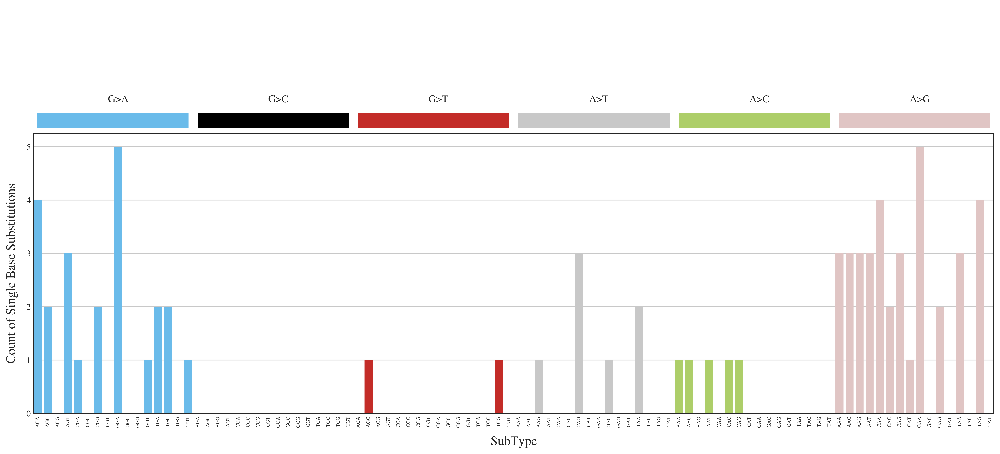

In [191]:
sbs_mut_plot(vcf_file_name = "HA_align.vcf",
reference_file_name = "HA_Ref.fasta",
base_type = 'purine', 
remove_pervasive=True)

133 alternate SNPs included.
0 identified SNPs do not match reference base!
59 total SNPs sorted into pyrimidine SBS-96 classification scheme


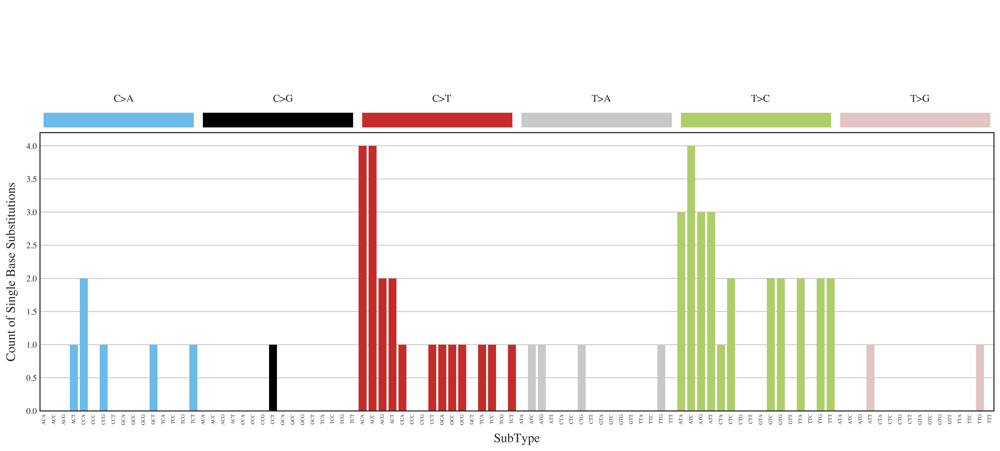

In [192]:
sbs_mut_plot(vcf_file_name = "HA_align.vcf",
reference_file_name = "HA_Ref.fasta",
base_type = 'pyrimidine', 
remove_pervasive=True)

# SBS Signature Plot 

### Plot mutation profile using the SBS-96 classification scheme (purine reference and pyrimidine reference plotted separately). Y axis is the normalized probability vector. 

In [193]:
def sbs_sig_plot(vcf_file_name, reference_file_name, base_type, remove_pervasive=True):

    reference =  str(next(SeqIO.parse(directory + "/" + reference_file_name, "fasta")).seq).upper()

    if remove_pervasive == True:
        vcf_reader = read_vcf(directory + "/" + vcf_file_name)
        values = vcf_reader.iloc[:, 10:]
        vcf_reader = vcf_reader.loc[list(values.loc[values.sum(axis=1) < values.shape[1]].index) , :]
        vcf_reader.reset_index(inplace=True, drop=True)

    else:
        vcf_reader = read_vcf(directory + "/" + vcf_file_name)

    position = []
    ref = []
    alt = []
    count = []
    for record in range(len(vcf_reader)):
        position.append(vcf_reader.loc[record, "POS"])
        ref.append(vcf_reader.loc[record, "REF"])
        alt.append([vcf_reader.loc[record, "ALT"]])
        if len(vcf_reader.loc[record, "ALT"]) > 1:
            count.append(round(vcf_reader.iloc[record, 10:].sum()/2))
        else:
            count.append(vcf_reader.iloc[record, 10:].sum())

    snps = pd.DataFrame()
    snps['position'] = position
    snps['reference'] = ref
    snps['alternate'] = [x[0].split(',') for x in alt]
    snps['count'] = count

    snps_expand = explode(snps, ["alternate"])

    sbs_96 = pd.read_excel(directory + "/WGS_PCAWG.96.xlsx")
    classification = sbs_96.iloc[:, :2]
    classification['Frequency'] = 0

    if base_type == "purine":
        for row in range(len(classification)):
            mut_type = classification.loc[row, 'Mutation type']
            if mut_type[0] == "C":
                classification.loc[row, 'Mutation type'] = "G" + str(mut_type[1:])   
            if mut_type[0] == "T":
                classification.loc[row, 'Mutation type'] = "A" + str(mut_type[1:])
            if classification.loc[row, 'Mutation type'][0] == "G" and classification.loc[row, 'Mutation type'][-1] == "G":
                classification.loc[row, 'Mutation type'] = classification.loc[row, 'Mutation type'][:2] + "C"
            if classification.loc[row, 'Mutation type'][0] == "A" and classification.loc[row, 'Mutation type'][-1] == "A":
                classification.loc[row, 'Mutation type'] = classification.loc[row, 'Mutation type'][:2] + "T"

            trinuc = classification.loc[row, 'Trinucleotide']

            if mut_type[0] == "C":
                classification.loc[row, 'Trinucleotide'] = str(trinuc[0]) + "G" + str(trinuc[-1])
            if mut_type[0] == "T":
                classification.loc[row, 'Trinucleotide'] = str(trinuc[0]) + "A" + str(trinuc[-1])

    else:
        pass 

    for i in range(len(snps_expand)):

        #position on ref seq
        position = snps_expand.loc[i, "position"] -1
        #trinuc context on ref seq
        trinuc_context = str(reference[position-1:position+2])

        #SBS classification
        mutation_type = str(snps_expand.loc[i, "reference"]) + ">" + str(snps_expand.loc[i, "alternate"])

        trinuc_filter = classification[classification['Trinucleotide'] == trinuc_context] 
        row_index = trinuc_filter[trinuc_filter['Mutation type'] == mutation_type].index

        classification.loc[row_index, 'Frequency'] += snps_expand.loc[i, 'count']

    classification['Probability'] = classification['Frequency'].div(classification['Frequency'].sum())

    fig = plt.figure(figsize=(20, 6))
    ax = fig.add_subplot(111)

    N = 96
    ind = np.arange(96)   

    color_list = [(0.416, 0.733, 0.918), (0,0,0), (0.765, 0.172, 0.157), (0.785, 0.785, 0.785), (0.678, 0.808, 0.412), (0.878, 0.773, 0.769)]

    p1 = ax.bar(range(0,16), classification.iloc[0:16, 3], bottom=0, color = color_list[0])
    p2 = ax.bar(range(16,32), classification.iloc[16:32, 3], bottom=0, color = color_list[1])
    p3 = ax.bar(range(32,48), classification.iloc[32:48, 3], bottom=0, color = color_list[2])
    p4 = ax.bar(range(48,64), classification.iloc[48:64, 3], bottom=0, color = color_list[3])
    p5 = ax.bar(range(64,80), classification.iloc[64:80, 3], bottom=0, color = color_list[4])
    p6 = ax.bar(range(80,96), classification.iloc[80:96, 3], bottom=0, color = color_list[5])

    y_limit = ax.get_ylim()[1]

    rect1 = patches.Rectangle((0, y_limit + y_limit/50), 15, y_limit/20, color = color_list[0], clip_on=False) 
    rect2 = patches.Rectangle((16, y_limit + y_limit/50), 15, y_limit/20, color = color_list[1], clip_on=False) 
    rect3 = patches.Rectangle((32, y_limit + y_limit/50), 15, y_limit/20, color = color_list[2], clip_on=False) 
    rect4 = patches.Rectangle((48, y_limit + y_limit/50), 15, y_limit/20, color = color_list[3], clip_on=False) 
    rect5 = patches.Rectangle((64, y_limit + y_limit/50), 15, y_limit/20, color = color_list[4], clip_on=False) 
    rect6 = patches.Rectangle((80, y_limit + y_limit/50), 15, y_limit/20, color = color_list[5], clip_on=False) 

    if base_type == 'pyrimidine':
        plt.text(7, y_limit + y_limit/9, "C>A", fontsize=12, weight="bold")
        plt.text(23, y_limit + y_limit/9, "C>G", fontsize=12, weight="bold")
        plt.text(39, y_limit + y_limit/9, "C>T", fontsize=12, weight="bold")
        plt.text(55, y_limit + y_limit/9, "T>A", fontsize=12, weight="bold")
        plt.text(71, y_limit + y_limit/9, "T>C", fontsize=12, weight="bold")
        plt.text(87, y_limit + y_limit/9, "T>G", fontsize=12, weight="bold")
    if base_type == 'purine':
        plt.text(7, y_limit + y_limit/9, "G>A", fontsize=12, weight="bold")
        plt.text(23, y_limit + y_limit/9, "G>C", fontsize=12, weight="bold")
        plt.text(39, y_limit + y_limit/9, "G>T", fontsize=12, weight="bold")
        plt.text(55, y_limit + y_limit/9, "A>T", fontsize=12, weight="bold")
        plt.text(71, y_limit + y_limit/9, "A>C", fontsize=12, weight="bold")
        plt.text(87, y_limit + y_limit/9, "A>G", fontsize=12, weight="bold")

    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.add_patch(rect4)
    ax.add_patch(rect5)
    ax.add_patch(rect6)

    ax.set_xlabel('Trinucleotide SubType', fontsize=15, weight="bold")
    ax.yaxis.set_label_text('Proportion of Single Base Substitutions', fontsize=15, weight="bold")

    ax.set_xticks(ind)
    ax.set_xticklabels(classification['Trinucleotide'], fontsize=6)

    plt.xticks(rotation=90)
    ax.margins(x=0)
    ax.set_title("SBS-96 Mutation Signature Plot", pad=140)

    ax.grid(axis = 'y', color=color_list[3], linestyle='-', linewidth = 1)
    ax.set_axisbelow(True)
    ax.xaxis.labelpad= 10
    ax.yaxis.labelpad= 10
    plt.show()

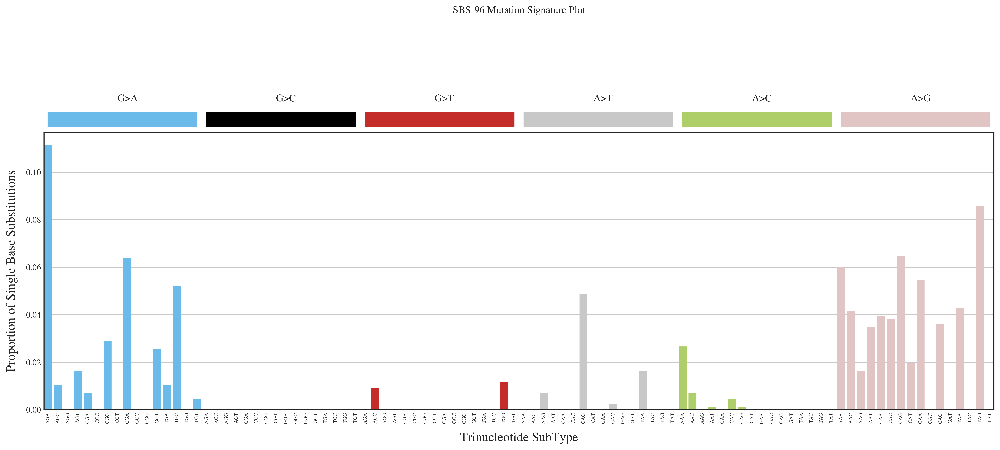

In [195]:
sbs_sig_plot(vcf_file_name = "HA_align.vcf",
reference_file_name = "HA_Ref.fasta",
base_type = 'purine',
remove_pervasive = True)

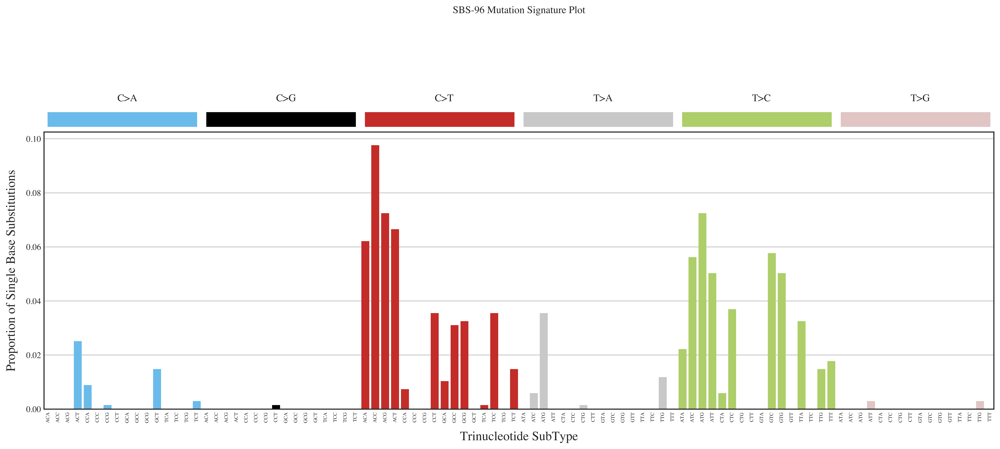

In [196]:
sbs_sig_plot(vcf_file_name = "HA_align.vcf",
reference_file_name = "HA_Ref.fasta",
base_type = 'pyrimidine',
remove_pervasive = True)

# Search for all variants in a clade with a substitution at a specific genomic position

In [14]:
def variant_search_position(vcf_file_name, position):
    data_vcf = read_vcf(vcf_file_name)
    sample = data_vcf[data_vcf["POS"] == position].iloc[:,9:]
    sample = sample.replace(0, np.nan)
    return sample.dropna(how="all", axis=1).columns.tolist()
    

In [15]:
variant_search_position(vcf_file_name="HA_align.vcf", position=4)

['12-2017-MN416650.1',
 '02-2018-MN416587.1',
 '01-2017-MN416596.1',
 '02-2018-MN416622.1',
 '02-2018-MN416620.1',
 '01-2017-MN416607.1',
 '12-2016-MN416642.1',
 '12-2017-MN416651.1',
 '02-2018-MN416619.1',
 '02-2018-MN416586.1',
 '01-2017-MN416597.1',
 '02-2018-MN416621.1',
 '03-2018-MN416625.1',
 '12-2016-MN416643.1',
 '03-2018-MN416589.1',
 '03-2017-MN416640.1',
 '10-2016-MN416645.1',
 '02-2017-MN416608.1',
 '11-2016-MN416627.1',
 '10-2016-MN416649.1',
 '03-2017-MN416639.1',
 '03-2017-MN416641.1',
 '10-2016-MN416644.1',
 '02-2017-MN416598.1',
 '11-2016-MN416628.1',
 '11-2016-MN416629.1']

In [16]:
def variant_search_range(vcf_file_name, start_position, end_position):
    data_vcf = read_vcf(vcf_file_name)
    search_df = pd.DataFrame(columns = ["position", "reference_id"])
    for i in range(start_position, end_position + 1):
        sample = data_vcf[data_vcf["POS"] == i].iloc[:,9:]
        sample = sample.replace(0, np.nan)
        reference_id = sample.dropna(how="all", axis=1).columns.tolist() 
        if len(reference_id)>0:
            search_df = search_df.append(pd.DataFrame({"position": [i], "reference_id": [reference_id]}), ignore_index=True)
        else:
            pass
    return search_df

In [17]:
variant_search_range(vcf_file_name="HA_align.vcf", start_position=0, end_position=100)

,position,reference_id
0,4,"[12-2017-MN416650.1, 02-2018-MN416587.1, 01-20..."
1,6,"[12-2017-MN416650.1, 02-2018-MN416587.1, 03-20..."
2,11,"[12-2017-MN416650.1, 02-2018-MN416587.1, 03-20..."
3,13,"[12-2017-MN416650.1, 02-2018-MN416587.1, 03-20..."
4,16,"[12-2017-MN416650.1, 02-2018-MN416587.1, 03-20..."
5,18,"[12-2017-MN416650.1, 02-2018-MN416587.1, 03-20..."
6,21,"[12-2017-MN416650.1, 02-2018-MN416587.1, 03-20..."
7,22,"[12-2017-MN416650.1, 02-2018-MN416587.1, 03-20..."
8,24,"[12-2017-MN416650.1, 02-2018-MN416587.1, 03-20..."
9,25,"[12-2017-MN416650.1, 02-2018-MN416587.1, 03-20..."


# Search for all variants in a clade with a specific reference to alternate base substitution¶

In [18]:
def variant_search_base(vcf_file_name, ref_base, alt_base):
    data_vcf = read_vcf(vcf_file_name)
    sample = data_vcf[data_vcf["REF"] == ref_base]
    sample = data_vcf[data_vcf["ALT"] == alt_base].iloc[:,9:]
    sample = sample.replace(0, np.nan)
    return sample.dropna(how="all", axis=1).columns.tolist()

In [19]:
variant_search_base(vcf_file_name="HA_align.vcf", ref_base='G', alt_base='A')

['12-2017-MN416650.1',
 '02-2018-MN416587.1',
 '03-2018-MN416626.1',
 '01-2017-MN416596.1',
 '02-2018-MN416622.1',
 '02-2018-MN416620.1',
 '01-2017-MN416607.1',
 '12-2016-MN416642.1',
 '03-2018-MN416624.1',
 '12-2017-MN416651.1',
 '02-2018-MN416619.1',
 '02-2018-MN416586.1',
 '01-2017-MN416597.1',
 '02-2018-MN416621.1',
 '03-2018-MN416625.1',
 '12-2016-MN416643.1',
 '03-2018-MN416589.1',
 '03-2017-MN416640.1',
 '10-2016-MN416645.1',
 '02-2017-MN416608.1',
 '11-2016-MN416627.1',
 '10-2016-MN416649.1',
 '03-2017-MN416639.1',
 '03-2017-MN416641.1',
 '10-2016-MN416644.1',
 '02-2017-MN416598.1',
 '11-2016-MN416628.1',
 '11-2016-MN416629.1']

# Search for top n variants with the highest mutation burden

In [26]:
def variant_search_top_n(vcf_file_name, top_n):
    data_vcf = read_vcf(vcf_file_name)
    return data_vcf.iloc[:,9:].sum(axis=0).nlargest(top_n)

In [27]:
variant_search_top_n(vcf_file_name="HA_align.vcf", top_n=100)

03-2018-MN416589.1    462
03-2018-MN416625.1    460
02-2018-MN416587.1    460
03-2018-MN416626.1    459
03-2018-MN416624.1    459
12-2017-MN416651.1    459
02-2018-MN416586.1    459
11-2016-MN416628.1    457
10-2016-MN416649.1    457
11-2016-MN416627.1    457
11-2016-MN416629.1    456
10-2016-MN416644.1    456
10-2016-MN416645.1    455
02-2018-MN416621.1    454
02-2018-MN416619.1    454
02-2018-MN416620.1    454
02-2018-MN416622.1    454
01-2017-MN416607.1    451
03-2017-MN416639.1    450
01-2017-MN416596.1    450
02-2017-MN416598.1    449
12-2016-MN416642.1    448
02-2017-MN416608.1    448
01-2017-MN416597.1    447
12-2016-MN416643.1    447
03-2017-MN416641.1    447
03-2017-MN416640.1    446
12-2017-MN416650.1    444
NC_026433.1             0
dtype: int64

# Individual Genome Rainfall Plot with Reference Genome Annotation Map

In [184]:
def rainfall_plot_individual(vcf_file_name, sequence_header, remove_pervasive = True):

    
    if remove_pervasive == True:
        df = read_vcf(vcf_file_name)
        values = df.copy().iloc[:, 10:]
        df = df.loc[list(values.loc[values.sum(axis=1) < values.shape[1]].index) , :]
        df.reset_index(inplace=True, drop=True)
        vcf = df.iloc[:, 1:5]
        vcf[sequence_header] = df[sequence_header]

        filter_vcf = vcf[vcf[sequence_header] != 0]
        filtered_df = pd.DataFrame(columns = ['position', 'reference', 'alternate'])
        filtered_df['reference'] = filter_vcf['REF']
        filtered_df['alternate'] = filter_vcf['ALT']
        filtered_df['position'] = filter_vcf['POS']
        filtered_df.reset_index(inplace=True, drop=True)

    else:
        variants = read_vcf(vcf_file_name)
        vcf = variants.iloc[:, 1:5]
        vcf[sequence_header] = df[sequence_header]

        filter_vcf = vcf[vcf[sequence_header] != 0]
        filtered_df = pd.DataFrame(columns = ['position', 'reference', 'alternate'])
        filtered_df['reference'] = filter_vcf['REF']
        filtered_df['alternate'] = filter_vcf['ALT']
        filtered_df['position'] = filter_vcf['POS']
        filtered_df.reset_index(inplace=True, drop=True)                 

    filtered_distance = [1]
    for i in range(1, len(filtered_df)):
        filtered_distance.append(filtered_df.iloc[i,0] - filtered_df.iloc[i-1,0])

    fig, ax = plt.subplots(figsize=(20, 10))
    for mut in range(len(filtered_df)):
        try:
            marker = reference_dict[filtered_df.loc[mut, 'reference']]
            color = alternate_dict[str(filtered_df.loc[mut, 'alternate'][0])]
            ax.scatter(filtered_df.loc[mut,"position"], filtered_distance[mut], c=color, marker=marker, s=100)
        except:
            pass
                             
    ax.set_yscale("log")
    ax.set_xlim([0, list(filtered_df['position'])[-1]])
    ax.set_ylim([1, 10 ** (len(str(max(filtered_distance))))])
    ax.set_title("Rainfall Plot", pad=20)
    ax.set_xlabel("Genomic Position", labelpad=10)
    ax.set_ylabel("Genomic Distance", labelpad=10)

    A_C = mlines.Line2D([], [], color='indigo', marker='o', linestyle='None',
                              markersize=15, label='A>C')
    A_G = mlines.Line2D([], [], color='forestgreen', marker='o', linestyle='None',
                              markersize=15, label='A>G')
    A_T = mlines.Line2D([], [], color='royalblue', marker='o', linestyle='None',
                              markersize=15, label='A>T')

    C_A = mlines.Line2D([], [], color='firebrick', marker='X', linestyle='None',
                              markersize=15, label='C>A')
    C_G = mlines.Line2D([], [], color='forestgreen', marker='X', linestyle='None',
                              markersize=15, label='C>G')
    C_T = mlines.Line2D([], [], color='royalblue', marker='X', linestyle='None',
                              markersize=15, label='C>T')

    G_A = mlines.Line2D([], [], color='firebrick', marker='D', linestyle='None',
                              markersize=15, label='G>A')
    G_C = mlines.Line2D([], [], color='indigo', marker='D', linestyle='None',
                              markersize=15, label='G>C')
    G_T = mlines.Line2D([], [], color='royalblue', marker='D', linestyle='None',
                              markersize=15, label='G>T')

    T_A = mlines.Line2D([], [], color='firebrick', marker='^', linestyle='None',
                              markersize=15, label='T>A')
    T_C = mlines.Line2D([], [], color='indigo', marker='^', linestyle='None',
                              markersize=15, label='T>C')
    T_G = mlines.Line2D([], [], color='forestgreen', marker='^', linestyle='None',
                              markersize=15, label='T>G')

    fig.patch.set_facecolor('white')
    plt.legend(handles=[A_C, A_G, A_T, C_A, C_G, C_T, G_A, G_C, G_T, T_A, T_C, T_G], title='Variant Classification', bbox_to_anchor=(1.1, 1),labelspacing=2)

    fig.tight_layout()
    plt.rcParams.update({'mathtext.default':  'regular' })
    #plt.rcParams['font.size'] = 10
    plt.rcParams["font.family"] = "serif"
    plt.rcParams["font.serif"] = "Times"
    plt.rcParams["figure.dpi"] = 600
    plt.show()

In [185]:
rainfall_plot_individual(vcf_file_name = "HA_align.vcf", sequence_header = '12-2017-MN416650.1', remove_pervasive=True)

# Mutation Landscape Plot¶

In [109]:
import random

In [182]:
def mutation_landscape(vcf_file_name, remove_pervasive=True):

    reference_dict = {"A": "o","C": "x", "G": "D" , "T":"^" }
    alternate_dict = {"A": "firebrick","C": "indigo", "G": "forestgreen" , "T":"royalblue"}

    if remove_pervasive == True:
        df = read_vcf(vcf_file_name)
        values = df.copy().iloc[:, 10:]
        df = df.loc[list(values.loc[values.sum(axis=1) < values.shape[1]].index) , :]
        df.reset_index(inplace=True, drop=True)

    else:
        df = read_vcf(directory + "/" + vcf_file_name)

    filtered_df = df.copy().iloc[:, 10:].T

    foo = [x.split("-")[:2] for x in filtered_df.index]
    random_days = np.random.choice(range(1, 28), len(foo))
    dates = [datetime(int(foo[x][1]), int(foo[x][0].strip("0")), random_days[x]) for x in range(len(foo))]

    filtered_df.index = dates
    filtered_df.drop(filtered_df.index[[i for i, x in enumerate(dates) if x == 0]], inplace=True)
    filtered_df.sort_index(inplace=True)
    month_index = collections.OrderedDict()
    date_count = Counter(dates)

    remove_pervasive_mutations = filtered_df

    remove_pervasive_mutations.index = dates

    fig, ax = plt.subplots(figsize=(16,12))
    for sequence in tqdm(range(remove_pervasive_mutations.shape[1])):
        rows = filtered_df.iloc[:, sequence ]
        rows = rows[rows>0]
        if len(rows) < 1:
            pass
        else:
            counter = 0
            for mutation in list(rows.index):
                if len(df.loc[remove_pervasive_mutations.columns[sequence], 'ALT']) > 1:
                    iterable = df.loc[remove_pervasive_mutations.columns[sequence], 'ALT'].split(",")
                    random.shuffle(iterable)
                    for i in iterable:
                        try:
                            marker = reference_dict[df.loc[remove_pervasive_mutations.columns[sequence], 'REF']]
                            color = alternate_dict[i]
                            plt.scatter(df.loc[remove_pervasive_mutations.columns[sequence], "POS"], mutation,  c=color, marker=marker)
                            counter += 1
                        except:
                            pass

                else:
                    try:
                        marker = reference_dict[df.loc[remove_pervasive_mutations.columns[sequence], 'REF']]
                        color = alternate_dict[df.loc[remove_pervasive_mutations.columns[sequence], 'ALT']]

                        plt.scatter(df.loc[remove_pervasive_mutations.columns[sequence], "POS"], mutation,  c=color, marker=marker)
                        counter += 1
                    except:
                        pass

    ax.set_xlim([0, list(df['POS'])[-1]])

    ax.set_title("Mutation Landscape Plot (n="+ str(len(filtered_df)) + ")", pad=20)
    ax.set_xlabel("Genomic Position", labelpad=10)
    ax.set_ylabel("Sequence", labelpad=10)
    #ax.set_yticks(range(0, filtered_df.shape[0]))
    #ax.set_yticklabels(foo)
    fig.patch.set_facecolor('white')

    A_C = mlines.Line2D([], [], color='indigo', marker='o', linestyle='None',
                              markersize=15, label='A>C')
    A_G = mlines.Line2D([], [], color='forestgreen', marker='o', linestyle='None',
                              markersize=15, label='A>G')
    A_T = mlines.Line2D([], [], color='royalblue', marker='o', linestyle='None',
                              markersize=15, label='A>T')

    C_A = mlines.Line2D([], [], color='firebrick', marker='X', linestyle='None',
                              markersize=15, label='C>A')
    C_G = mlines.Line2D([], [], color='forestgreen', marker='X', linestyle='None',
                              markersize=15, label='C>G')
    C_T = mlines.Line2D([], [], color='royalblue', marker='X', linestyle='None',
                              markersize=15, label='C>T')

    G_A = mlines.Line2D([], [], color='firebrick', marker='D', linestyle='None',
                              markersize=15, label='G>A')
    G_C = mlines.Line2D([], [], color='indigo', marker='D', linestyle='None',
                              markersize=15, label='G>C')
    G_T = mlines.Line2D([], [], color='royalblue', marker='D', linestyle='None',
                              markersize=15, label='G>T')

    T_A = mlines.Line2D([], [], color='firebrick', marker='^', linestyle='None',
                              markersize=15, label='T>A')
    T_C = mlines.Line2D([], [], color='indigo', marker='^', linestyle='None',
                              markersize=15, label='T>C')
    T_G = mlines.Line2D([], [], color='forestgreen', marker='^', linestyle='None',
                              markersize=15, label='T>G')

    plt.legend(handles=[A_C, A_G, A_T, C_A, C_G, C_T, G_A, G_C, G_T, T_A, T_C, T_G], title='Variant Classification', bbox_to_anchor=(1.2, 1), labelspacing=2)
    plt.show()

In [183]:
mutation_landscape(vcf_file_name="HA_align.vcf", remove_pervasive=True)


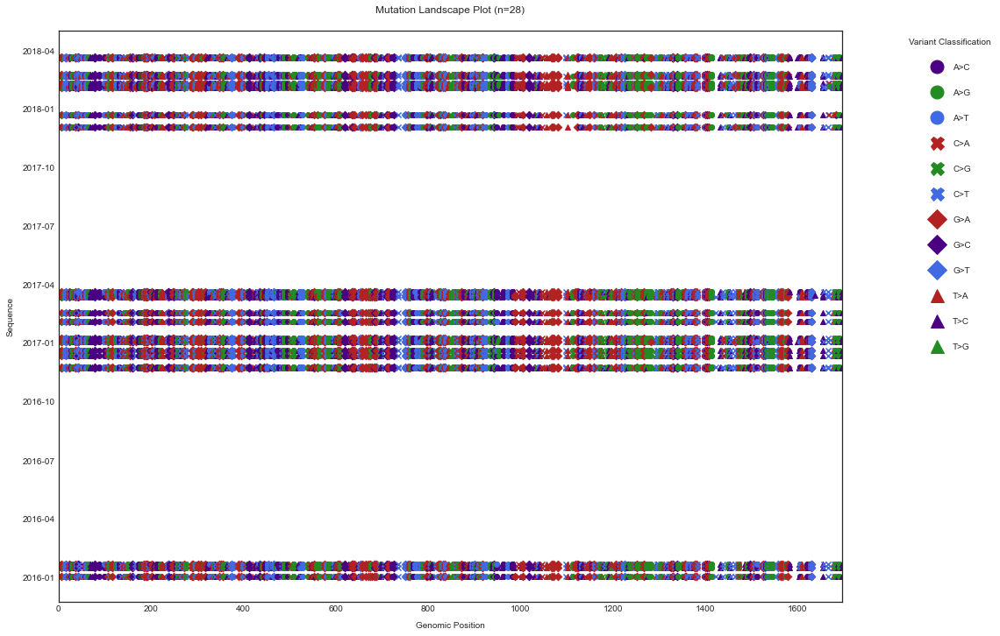

In [127]:
mutation_landscape(vcf_file_name="HA_align.vcf", remove_pervasive=False)


In [197]:
mutation_landscape(vcf_file_name="M_align.vcf", remove_pervasive=True)


In [198]:
mutation_landscape(vcf_file_name="NA_align.vcf", remove_pervasive=True)


In [199]:
mutation_landscape(vcf_file_name="NP_align.vcf", remove_pervasive=True)


In [200]:
mutation_landscape(vcf_file_name="NS1_align.vcf", remove_pervasive=True)


In [201]:
mutation_landscape(vcf_file_name="PA_align.vcf", remove_pervasive=True)


In [202]:
mutation_landscape(vcf_file_name="PB1_align.vcf", remove_pervasive=True)


In [203]:
mutation_landscape(vcf_file_name="PB2_align.vcf", remove_pervasive=True)


# Visualize mutation counts as a binned bar plot

In [216]:
def mutation_count(vcf_file_name, bin_size = 100, remove_pervasive = True):
    
    def roundup(x):
        return int(math.ceil(x / 100.0)) * 100

    if remove_pervasive == True:
        df = read_vcf(vcf_file_name)
        filtered_df = df.iloc[:, 10:].T
        remove_pervasive_df = filtered_df.loc[:, filtered_df.sum() < len(filtered_df)]
        x = [df.loc[x, "POS"] for x in remove_pervasive_df.columns]
        y = remove_pervasive_df.sum(axis=0)

        ax = pd.cut(x, bins=list(range(0, roundup(list(df['POS'])[-1]) + bin_size, bin_size)), include_lowest=True).value_counts().plot.bar(rot=45, color="royalblue", figsize=(10,3))
        ax.set_xticklabels([str(x) + "-" + str(x + bin_size-1) for x in list(range(0, roundup(list(df['POS'])[-1]) , bin_size))], ha="right")
        ax.set_xlim([-1, int((roundup(list(df['POS'])[-1]) /bin_size))])
        plt.title("Mutation Count Plot")
        plt.ylabel("Number of Mutations")
        plt.xlabel("Genomic Location")
        plt.show()

    else:
        df = read_vcf(vcf_file_name)

        x = df['POS']
        y = df.iloc[:, 9:].sum(axis=1)

        ax = pd.cut(x, bins=list(range(0, roundup(list(df['POS'])[-1]) + bin_size, bin_size)), include_lowest=True).value_counts(sort=False).plot.bar(rot=45, color="royalblue", figsize=(10,3))
        ax.set_xticklabels([str(x) + "-" + str(x + bin_size-1) for x in list(range(0, roundup(list(df['POS'])[-1]) , bin_size))], ha="right")
        ax.set_xlim([-1, int((roundup(list(df['POS'])[-1]) /bin_size))])
        plt.title("Mutation Count Plot")
        plt.ylabel("Number of Mutations")
        plt.xlabel("Genomic Location")
        plt.show()

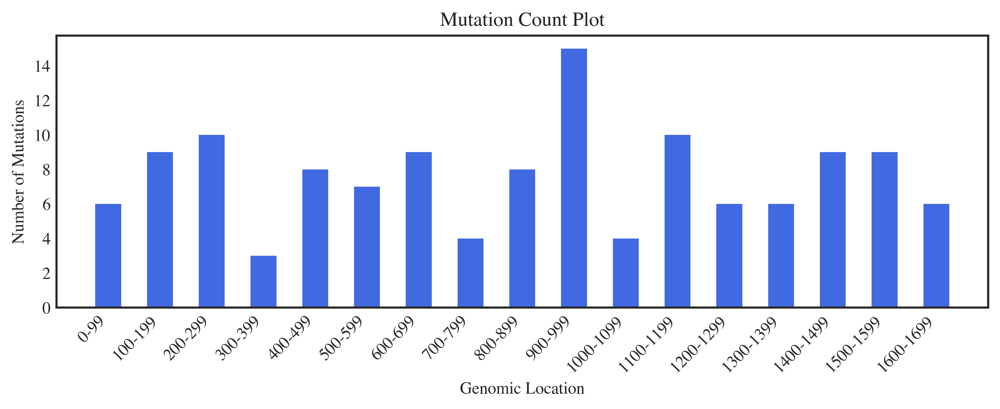

In [217]:
mutation_count("HA_align.vcf", bin_size = 100, remove_pervasive = True)

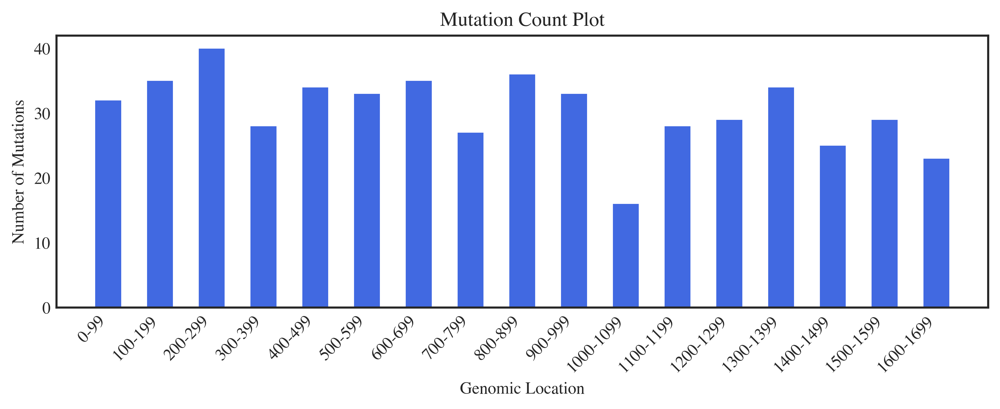

In [218]:
mutation_count("HA_align.vcf", bin_size = 100, remove_pervasive = False)